Concatinating all CSVs


In [14]:
import os
import pandas as pd

# Directory containing the CSV files
csv_dir = r"C:\Users\alexa\Thesis\OpenFace_2.2.0_win_x64\processed"

# Output path for the merged CSV
output_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\merged_openface_processed.csv"

# List all CSV files in the directory
csv_files = [f for f in os.listdir(csv_dir) if f.lower().endswith('.csv')]

# Read and concatenate all CSV files
df_list = []
for file in csv_files:
    file_path = os.path.join(csv_dir, file)
    try:
        df = pd.read_csv(file_path)
        # Insert 'source_title' as the first column
        Video_ID = os.path.splitext(file)[0]
        df.insert(0, 'Video_ID', Video_ID)
        df_list.append(df)
    except Exception as e:
        print(f"Error reading {file}: {e}")

if df_list:
    merged_df = pd.concat(df_list, ignore_index=True)
    merged_df.to_csv(output_path, index=False)
    print(f"Merged {len(csv_files)} files. Saved to {output_path}. Shape: {merged_df.shape}")
else:
    print("No CSV files found or all failed to read.")

Merged 2328 files. Saved to C:\Users\alexa\Thesis\Cleaned up code and dataset\merged_openface_processed.csv. Shape: (6087, 712)


In [20]:
import pandas as pd

# Load the merged CSV
merged_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\merged_openface_processed.csv"
au_cleaned_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\processed_faces_v4.csv"

df = pd.read_csv(merged_path)

# Keep columns containing 'AU', plus 'source_title', 'face', and any column with 'conf' in the name (case-insensitive)
keep_cols = [col for col in df.columns if (
    'AU' in col or 
    col.lower() == 'video_id' or 
    col.lower() == 'face' or 
    'conf' in col.lower()
)]
df_cleaned = df[keep_cols]

# Save the cleaned DataFrame
df_cleaned.to_csv(au_cleaned_path, index=False)
print(f"Saved AU-cleaned file to {au_cleaned_path}. Shape: {df_cleaned.shape}")
df_cleaned.head()

Saved AU-cleaned file to C:\Users\alexa\Thesis\Cleaned up code and dataset\processed_faces_v4.csv. Shape: (6087, 38)


,Video_ID,face,confidence,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,...,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,--8n6A8Q6M0,0,0.975,1.08,0.0,0.00,1.87,1.22,1.77,1.11,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,-0FfyNZdHk0,0,0.875,0.11,0.0,0.00,0.00,1.64,0.96,1.03,...,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,-0FfyNZdHk0,1,0.375,0.00,0.0,0.00,1.84,1.04,0.55,0.73,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-1B7cVoZr1c,0,0.975,0.77,0.0,1.03,0.01,0.85,1.87,0.34,...,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0
4,-1B7cVoZr1c,1,0.375,0.98,0.0,0.38,1.02,0.00,0.00,0.00,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
import os

# Directory containing the PNG thumbnails
thumbnails_dir = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\thumbnails-filtered"

# List all PNG files in the directory
png_files = [f for f in os.listdir(thumbnails_dir) if f.lower().endswith('.jpg')]

print(f"Total PNG files in thumbnails-filtered: {len(png_files)}")

Total PNG files in thumbnails-filtered: 2597


In [22]:
import os
import pandas as pd
import re

# Directory and merged CSV path
thumbnails_dir = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\thumbnails-filtered"
csv_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\merged_openface_processed.csv"

# Helper to get base title (removes _faceX and extension)
def get_base_title(filename):
    base = os.path.splitext(filename)[0]
    return re.sub(r'_face\d+$', '', base)

# List all JPG files and their base titles
jpg_files = [f for f in os.listdir(thumbnails_dir) if f.lower().endswith('.jpg')]
jpg_base_titles = {get_base_title(f) for f in jpg_files}

# Load the merged CSV and get all unique source_title values (ignore _faceX suffix)
df = pd.read_csv(csv_path)
if 'Video_ID' in df.columns:
    csv_base_titles = {re.sub(r'_face\d+$', '', str(title)) for title in df['Video_ID'].unique()}
else:
    csv_base_titles = set()

# Find JPG files whose base title is not present in the merged CSV
unused_jpgs = [f for f in jpg_files if get_base_title(f) not in csv_base_titles]

print(f"Unused JPG files in thumbnails-filtered (not present in merged_openface_processed.csv): {len(unused_jpgs)}")
for f in unused_jpgs:
    print(f)

Unused JPG files in thumbnails-filtered (not present in merged_openface_processed.csv): 269
0f3m80ZA8BM.jpg
0G5jfRhHsqg.jpg
0iNlBNR9PGE.jpg
0JiN_E6wK-E.jpg
0KyvSgEO6Fc.jpg
0rqsRvyIvIc.jpg
0s6stvGVAEk.jpg
15O6Q7JINkE.jpg
1kErCqgIVMk.jpg
1yG9Kki_BNg.jpg
1YXmTTKljwk.jpg
23GlZtU6eVY.jpg
2CLpCOnn-tk.jpg
2ftG8JuMzz4.jpg
2g63ty8ySoM.jpg
2S4TBBvNJ7E.jpg
2xD1WA0YVUE.jpg
2Y5LjRWFfkk.jpg
3gXTOa6Zskw.jpg
3PKGOy6PoiQ.jpg
3rRNKYvoDsQ.jpg
3x5rJk4R4gE.jpg
45nukMR5A_c.jpg
4OTAXBjCb10.jpg
4OzEgHVD5PA.jpg
4RRAgEb5r7Q.jpg
4TcUHcCj6To.jpg
4wY_xiZrl1I.jpg
58UzixzNCh4.jpg
59ruWusoMsY.jpg
5VXiVRQIFLs.jpg
675kMpNG0L8.jpg
6kgyyJxRWTU.jpg
6m57KaHerG0.jpg
6p6ZYZ4vHE4.jpg
7DbQ0qmSrIc.jpg
7HmaEa1cRWk.jpg
7NMm60VwNnU.jpg
7rNoNprvS4U.jpg
7WCTTAGYN5Y.jpg
7zNSjbWBo90.jpg
8a1Hsah_yuA.jpg
8d8tfV1uBn4.jpg
8w-X-NU-p9U.jpg
8zDbtAfmokY.jpg
9eeejXbcOa4.jpg
9nbuNLU2S-U.jpg
9XZDbjG2Hf8.jpg
A6jYxNYpT5A.jpg
Ae9RLvFXChQ.jpg
agJmf_4RkHQ.jpg
AI7Us_5-IaQ.jpg
AIVU8Rg7Jpo.jpg
aYJ0w1ZQfYg.jpg
aYxT9tCrADc.jpg
b0Sd5upIc6o.jpg
B8Ra9V5Novs.

Unused JPG files in thumbnails-filtered (not present in merged_openface_processed.csv): 269


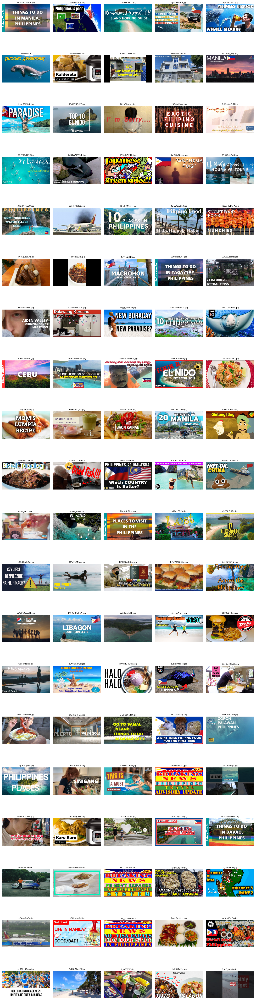

In [18]:
import os
import pandas as pd
import re
import matplotlib.pyplot as plt
from PIL import Image

# Directory and merged CSV path
thumbnails_dir = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\thumbnails-filtered"
csv_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\merged_openface_processed.csv"

def get_base_title(filename):
    base = os.path.splitext(filename)[0]
    return re.sub(r'_face\d+$', '', base)

# List all JPG files and their base titles
jpg_files = [f for f in os.listdir(thumbnails_dir) if f.lower().endswith('.jpg')]
jpg_base_titles = {get_base_title(f) for f in jpg_files}

# Load the merged CSV and get all unique source_title values (ignore _faceX suffix)
df = pd.read_csv(csv_path)
if 'Video_ID' in df.columns:
    csv_base_titles = {re.sub(r'_face\d+$', '', str(title)) for title in df['Video_ID'].unique()}
else:
    csv_base_titles = set()

# Find unused JPG files
unused_jpgs = [f for f in jpg_files if get_base_title(f) not in csv_base_titles]

print(f"Unused JPG files in thumbnails-filtered (not present in merged_openface_processed.csv): {len(unused_jpgs)}")

# Show unused JPGs in a grid (first 20 for preview)
n = min(100, len(unused_jpgs))
cols = 5
rows = (n + cols - 1) // cols

plt.figure(figsize=(15, 3 * rows))
for i, fname in enumerate(unused_jpgs[:n]):
    img_path = os.path.join(thumbnails_dir, fname)
    img = Image.open(img_path)
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(fname, fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [25]:
import pandas as pd

# Load the cleaned AU data
au_cleaned_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\processed_faces_v4.csv"
agg_path = r"C:\Users\alexa\Thesis\Cleaned up code and dataset\processed_faces_v4_aggregated.csv"

df = pd.read_csv(au_cleaned_path)

# Group by Video_ID and take the mean of all other columns
df_agg = df.groupby('Video_ID').mean(numeric_only=True).reset_index()

# Save and preview
df_agg.to_csv(agg_path, index=False)
print(f"Aggregated data saved to {agg_path}. Shape: {df_agg.shape}")

print("\nPreview of the aggregated data:")
print(df_agg.head())

Aggregated data saved to C:\Users\alexa\Thesis\Cleaned up code and dataset\processed_faces_v4_aggregated.csv. Shape: (2328, 38)

Preview of the aggregated data:
      Video_ID  face   confidence   AU01_r   AU02_r   AU04_r   AU05_r  \
0  --8n6A8Q6M0   0.0        0.975    1.080     0.00    0.000    1.870   
1  -0FfyNZdHk0   0.5        0.625    0.055     0.00    0.000    0.920   
2  -1B7cVoZr1c   0.5        0.675    0.875     0.00    0.705    0.515   
3  -4yu_13EHFM   0.0        0.975    0.920     0.17    0.000    0.010   
4  -6FvAU9H98w   0.0        0.875    2.770     1.90    0.000    0.890   

    AU06_r   AU07_r   AU09_r  ...   AU12_c   AU14_c   AU15_c   AU17_c  \
0    1.220    1.770     1.11  ...      1.0      1.0      0.0      0.0   
1    1.340    0.755     0.88  ...      0.5      0.5      0.5      0.5   
2    0.425    0.935     0.17  ...      0.5      1.0      0.0      0.5   
3    0.160    0.640     0.74  ...      0.0      0.0      0.0      0.0   
4    1.570    0.660     0.00  ...  